Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 197ms/step


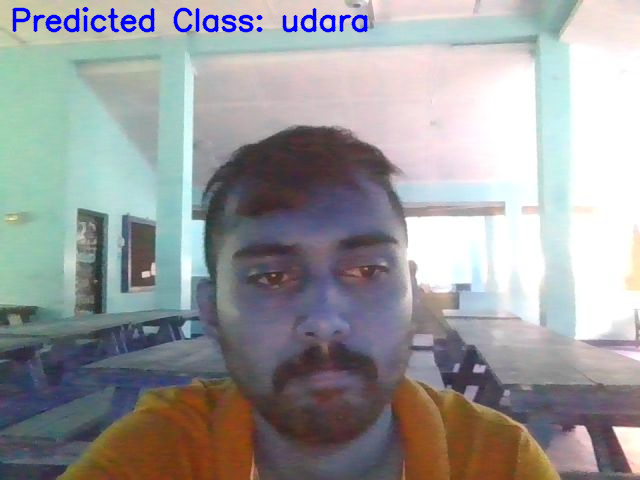

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 37ms/step


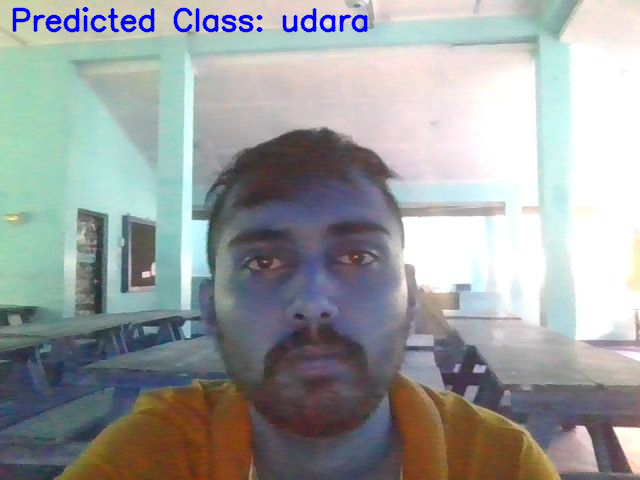

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 31ms/step


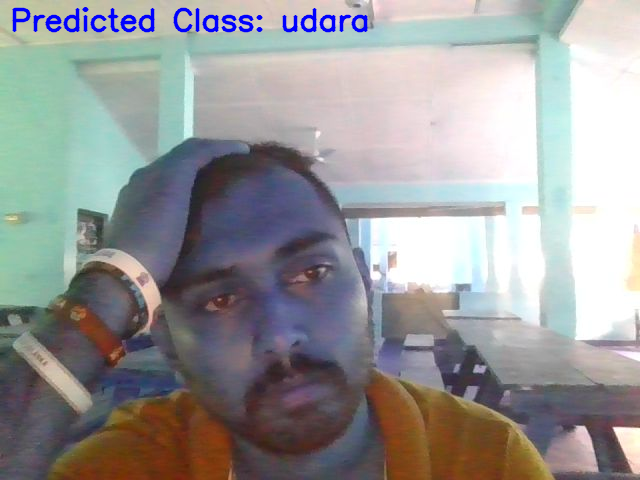

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 50ms/step


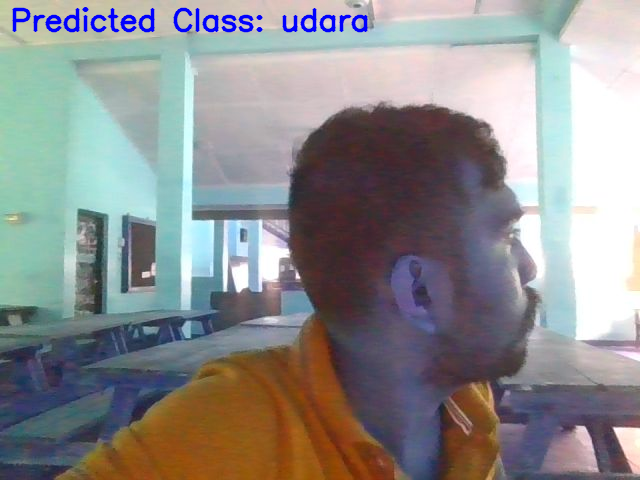

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 40ms/step


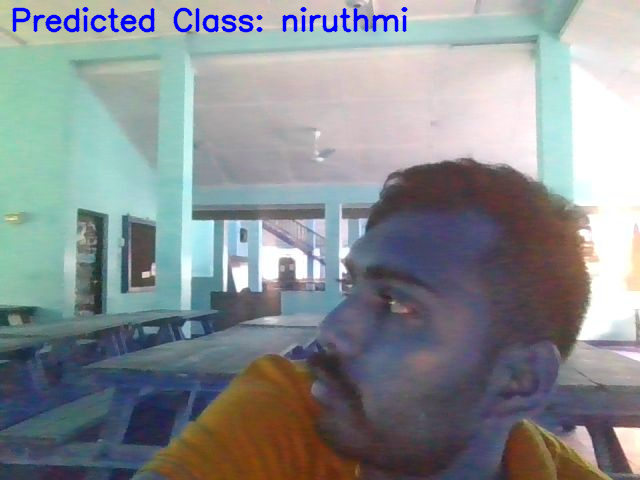

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 32ms/step


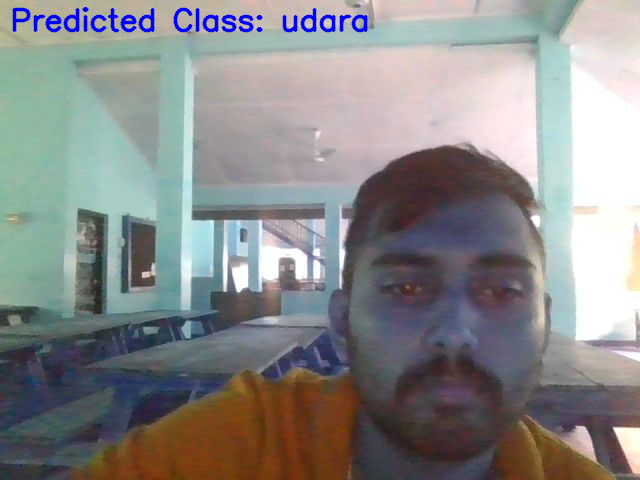

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 57ms/step


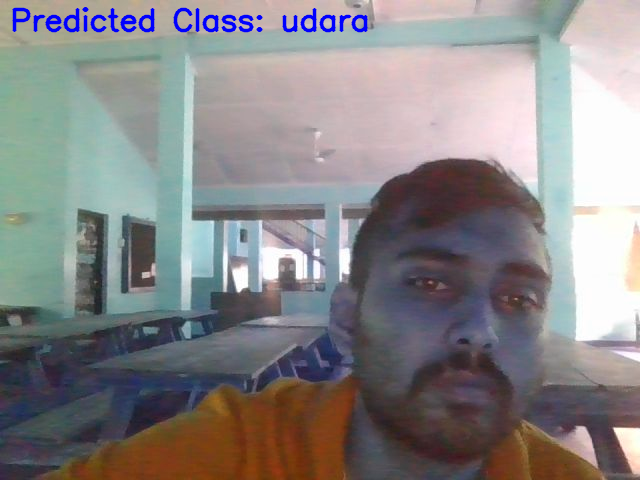

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 35ms/step


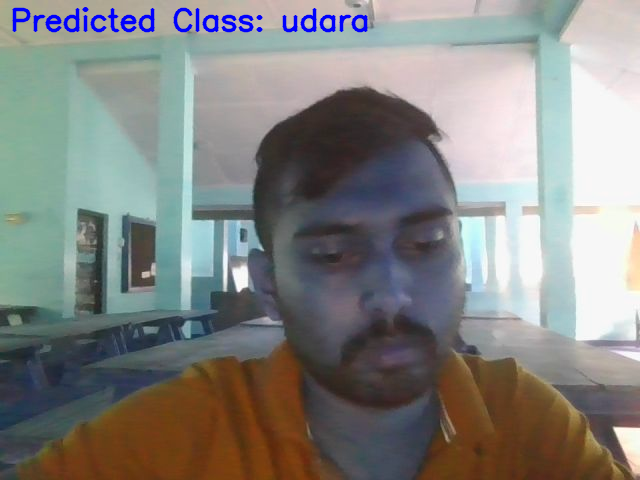

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 39ms/step


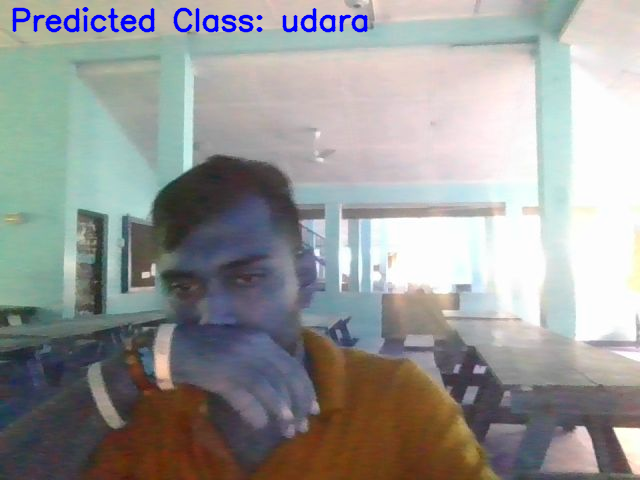

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 37ms/step


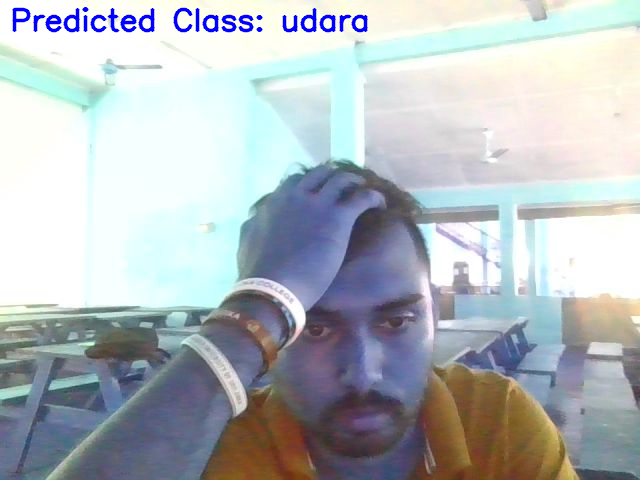

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 50ms/step


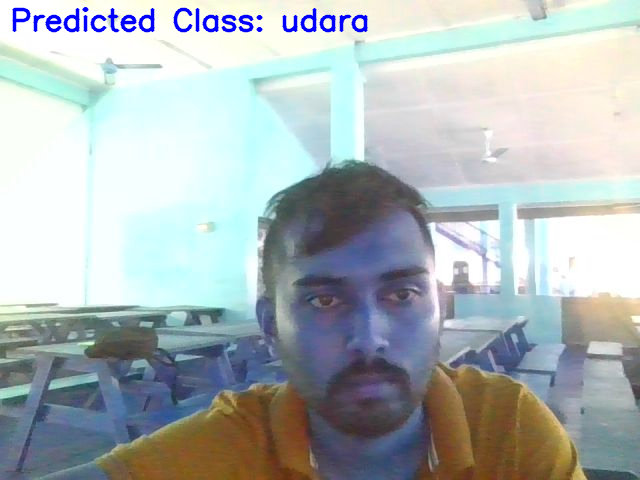

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 38ms/step


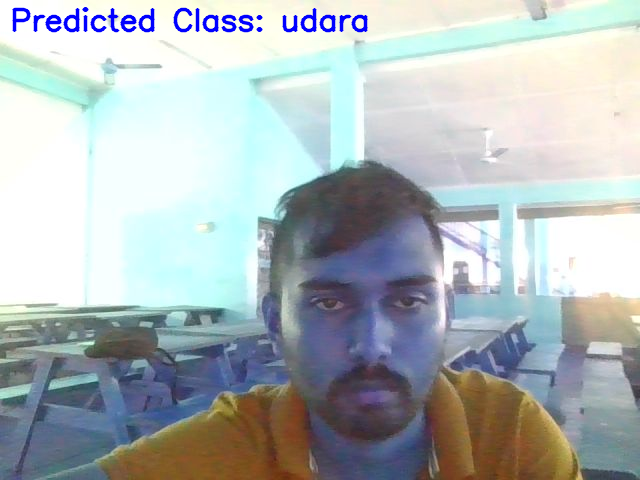

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 33ms/step


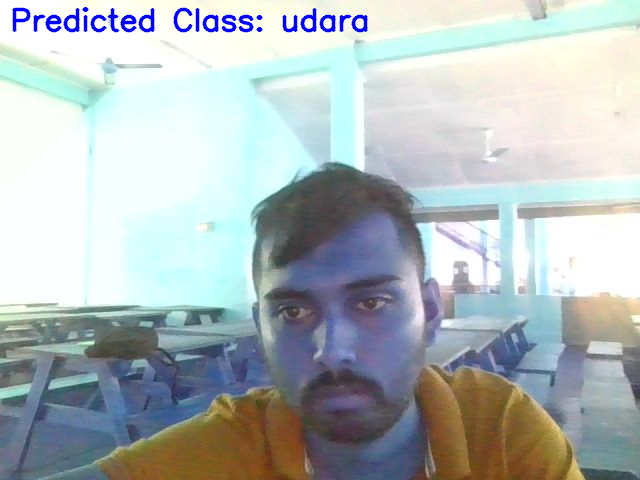

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 41ms/step


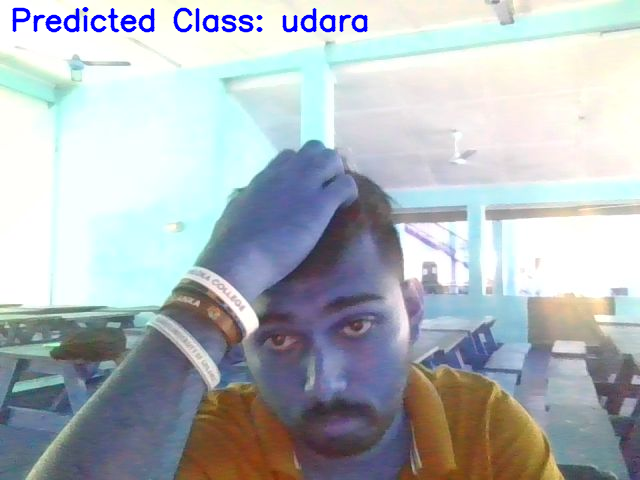

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 50ms/step


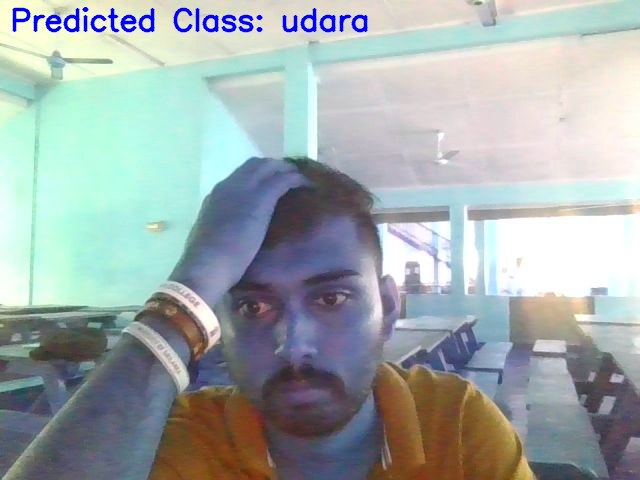

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 45ms/step


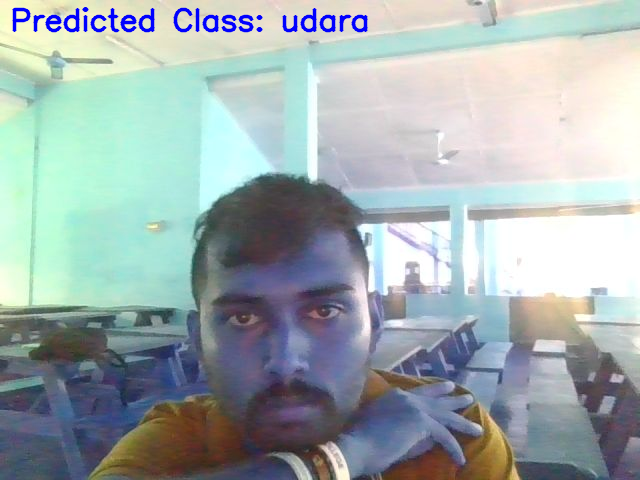

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 34ms/step


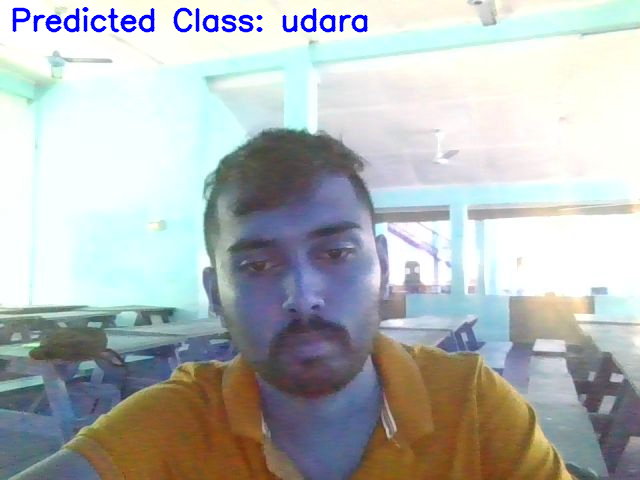

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 39ms/step


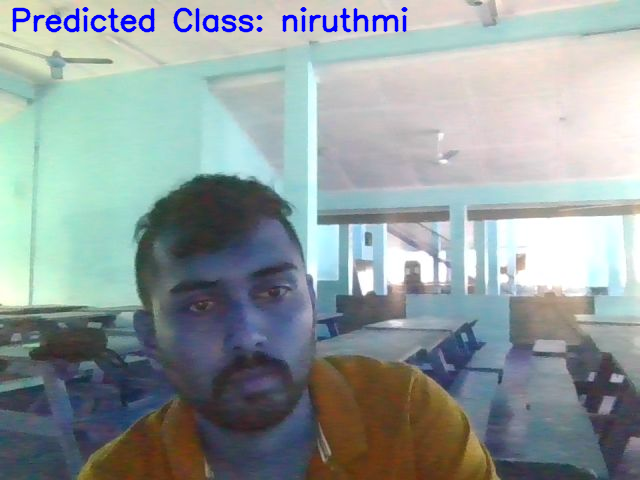

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 34ms/step


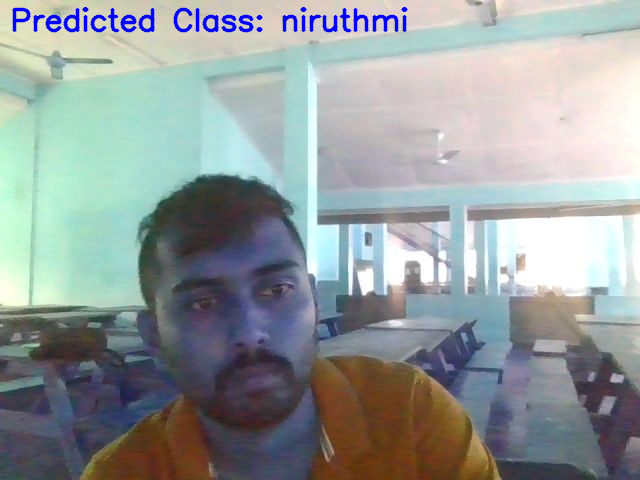

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 39ms/step


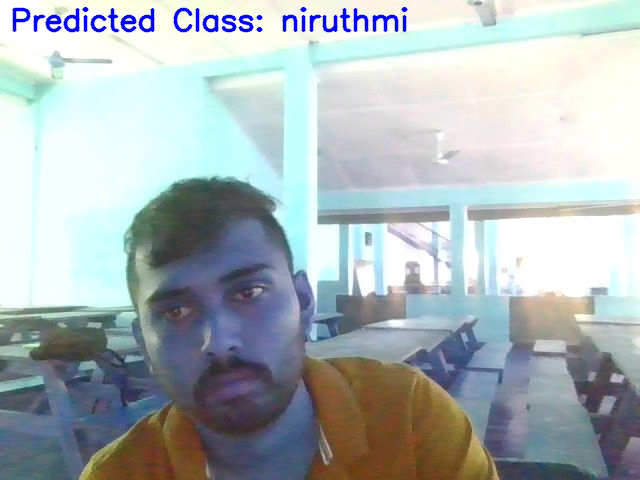

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 51ms/step


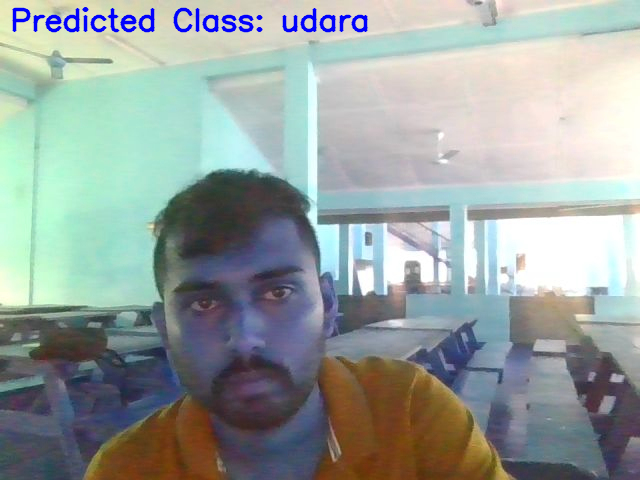

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 36ms/step


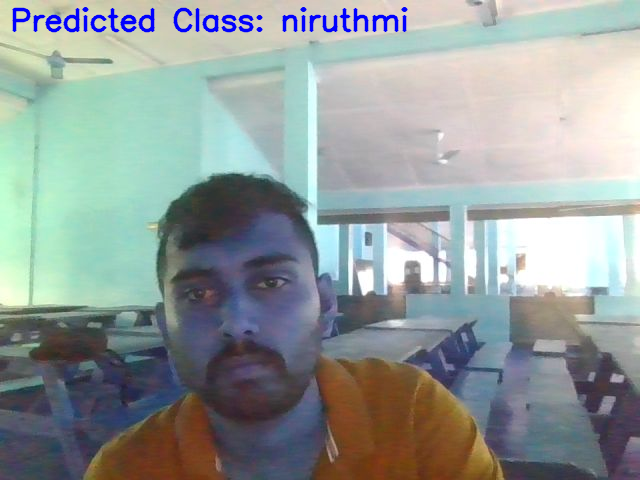

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 32ms/step


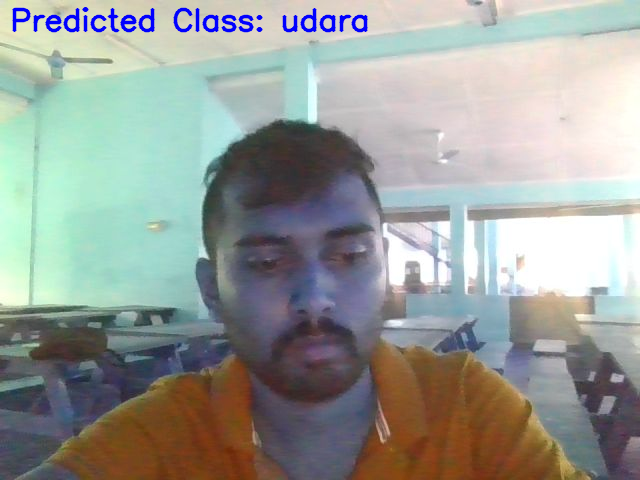

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 31ms/step


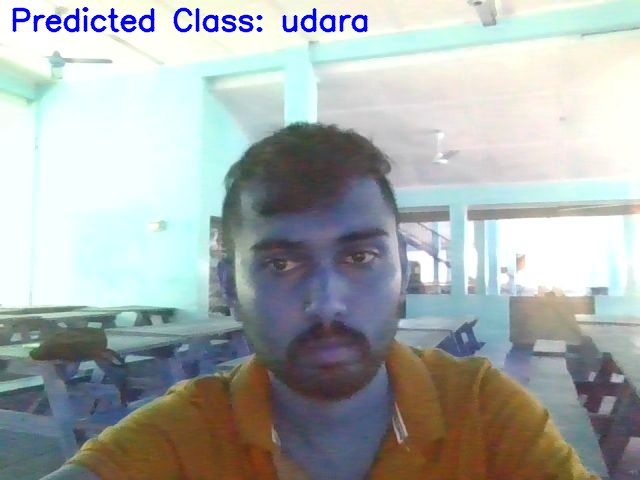

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 36ms/step


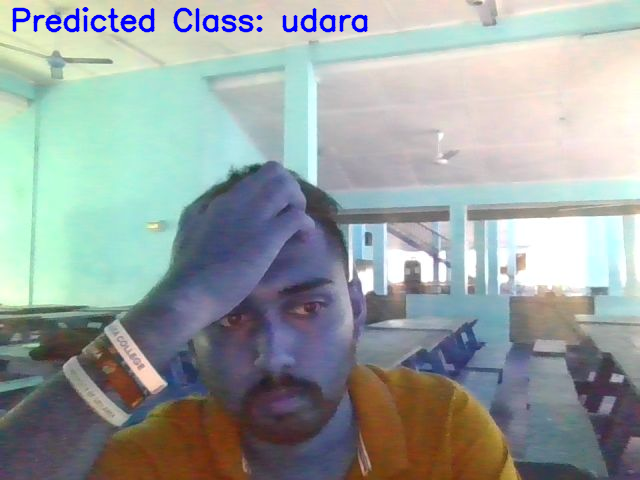

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 38ms/step


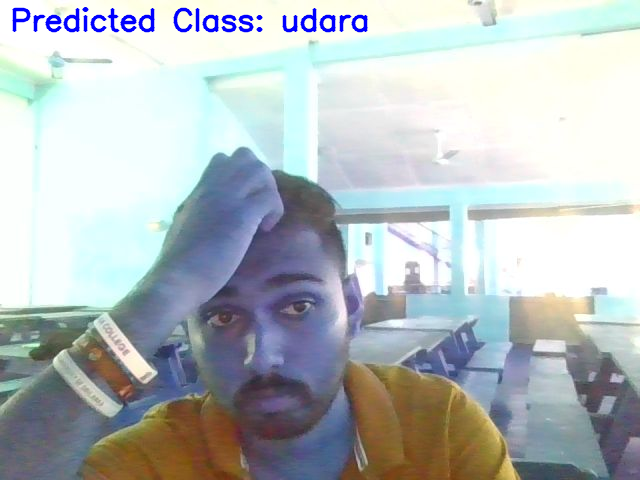

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 42ms/step


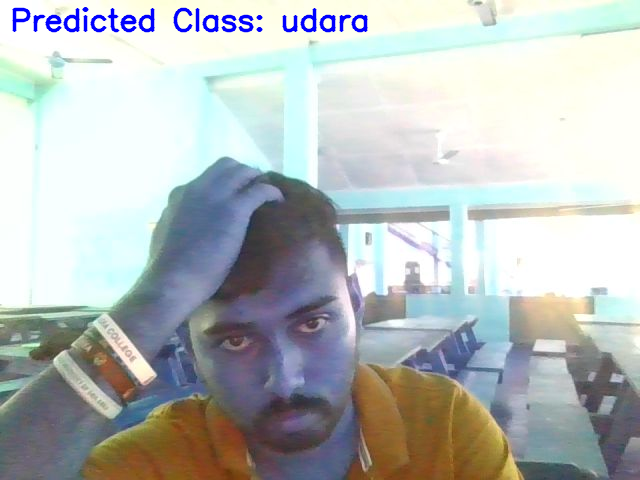

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 33ms/step


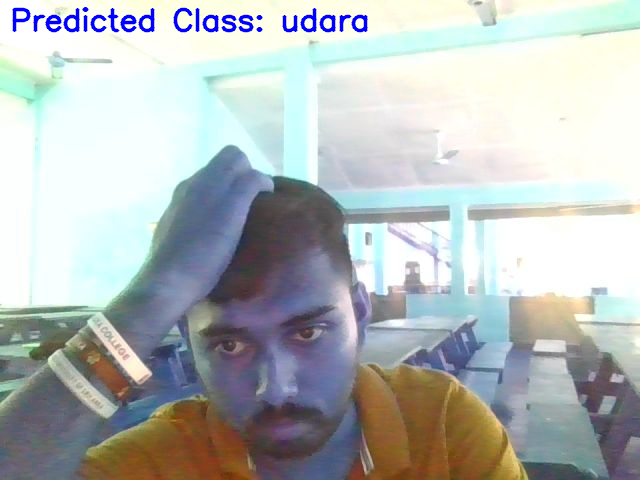

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 31ms/step


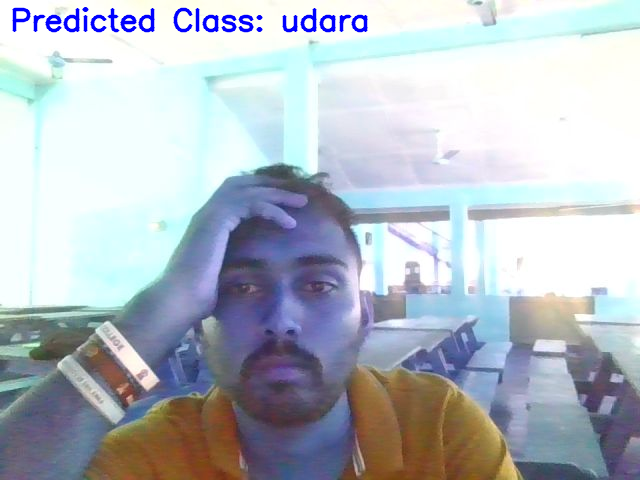

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 33ms/step


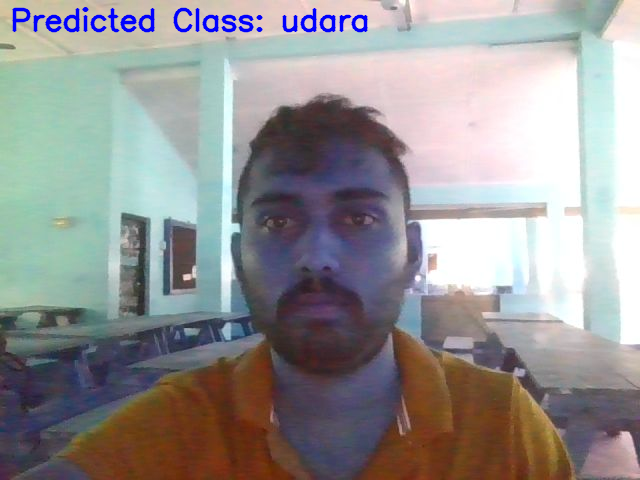

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 61ms/step


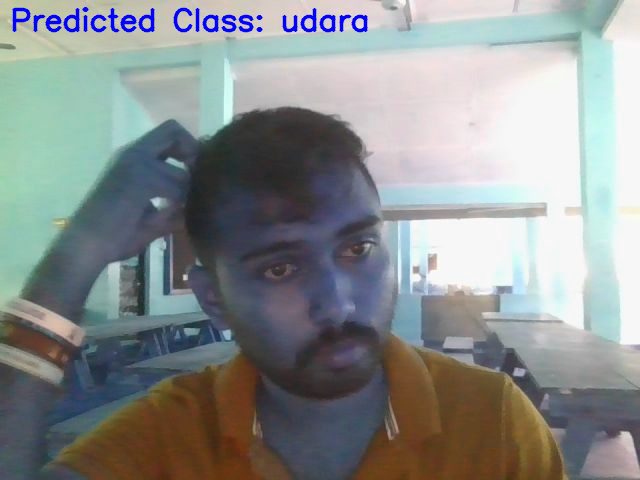

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 33ms/step


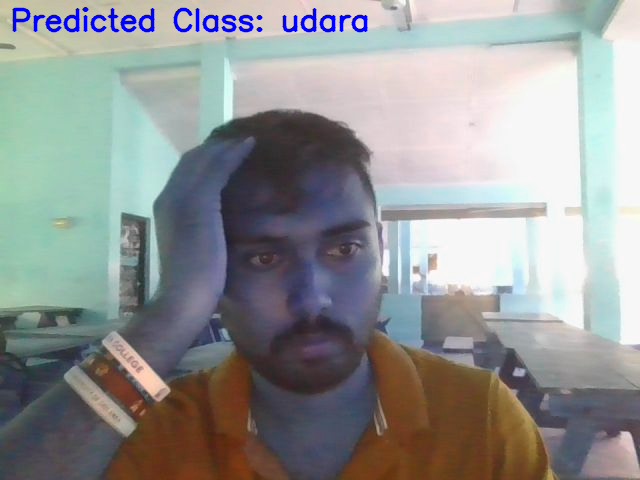

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 32ms/step


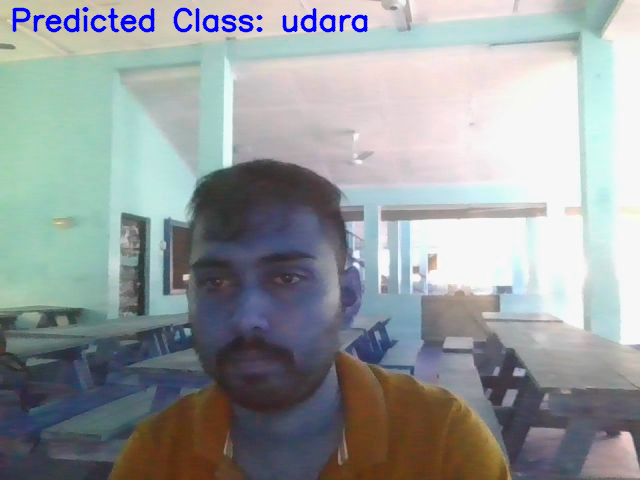

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 34ms/step


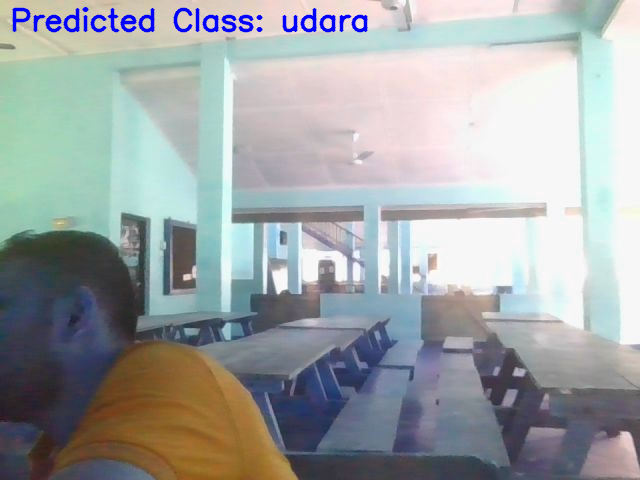

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 50ms/step


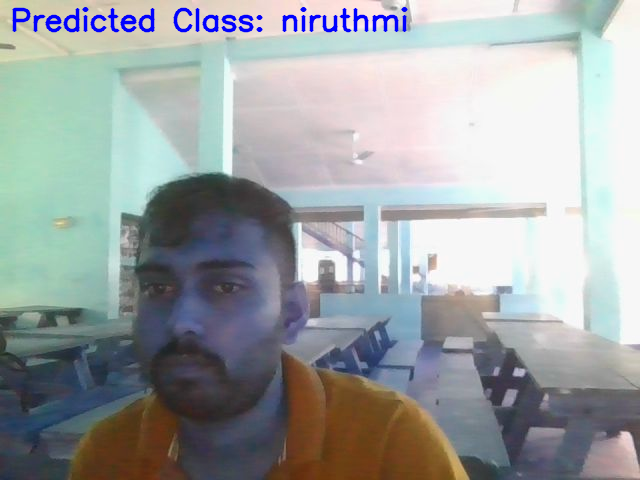

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 36ms/step


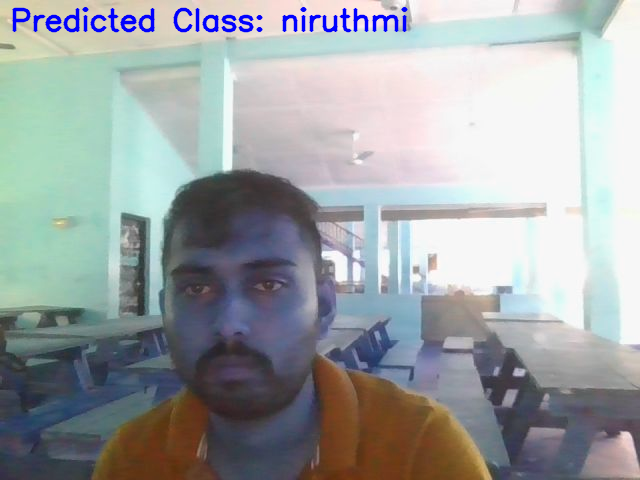

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 54ms/step


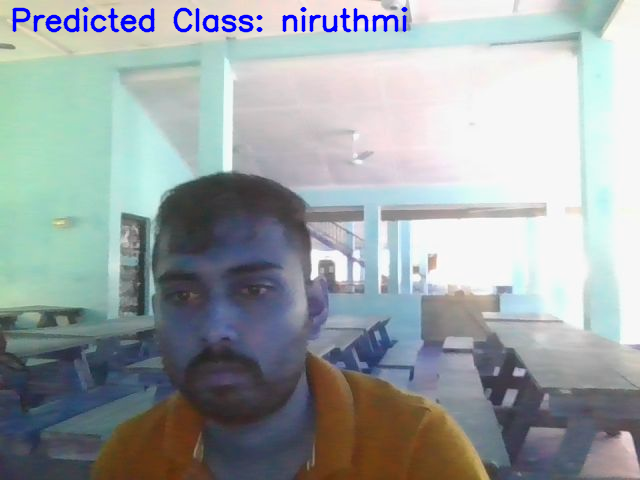

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 39ms/step


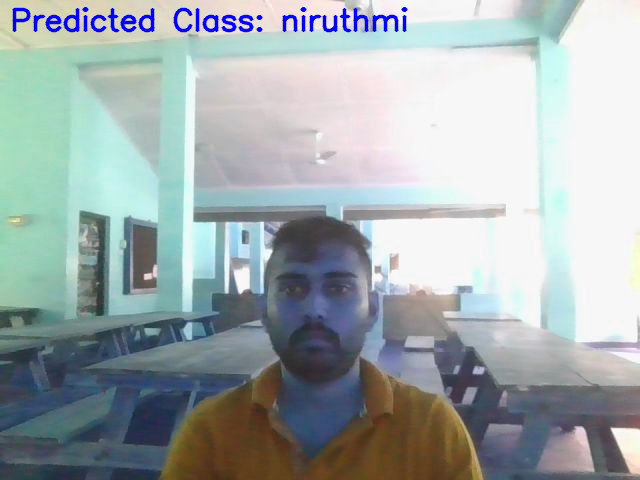

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 31ms/step


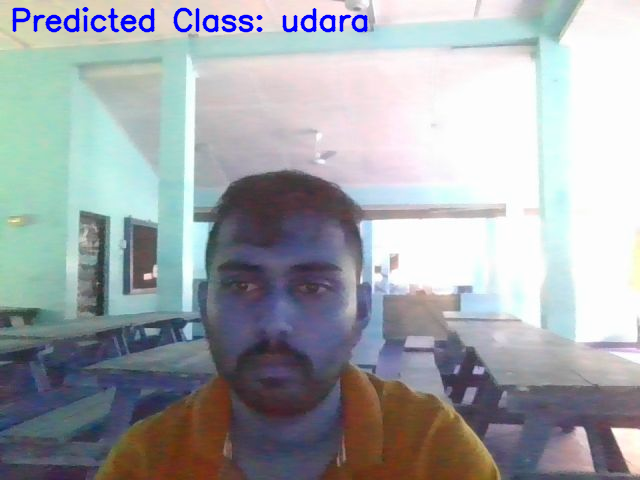

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 37ms/step


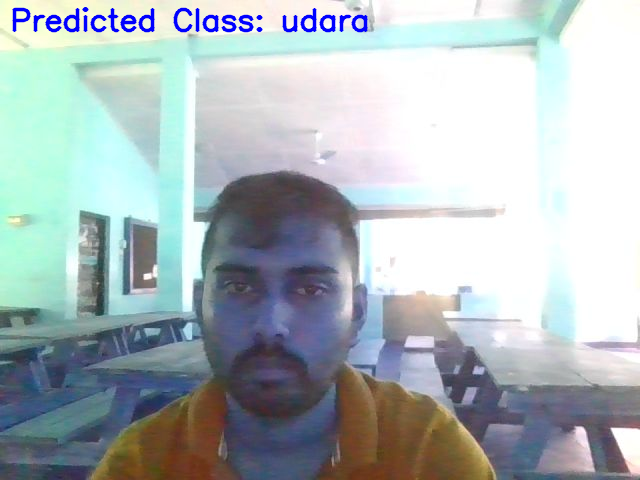

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 33ms/step


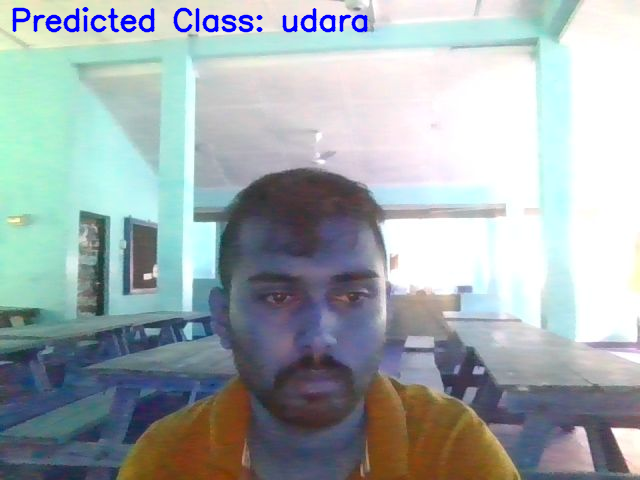

<IPython.core.display.Javascript object>

Stopped by user


In [ ]:
!pip install opencv-python-headless
import cv2
from google.colab.patches import cv2_imshow
from google.colab import drive
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image as keras_image
import numpy as np
from google.colab.output import eval_js
from IPython.display import display, Javascript
from base64 import b64decode
import PIL
import io
import time

# Mount Google Drive
drive.mount('/content/drive')

# Path to your pretrained model
model_path = '/content/drive/MyDrive/trainedmodel/identifier.h5'

# Load your pretrained model
model = load_model(model_path)

# Define the class names corresponding to your model's output labels
class_names = ['niruthmi', 'nethmini', 'udara', 'ashan', 'Person 5']  # Update this list with your class names

# Function to preprocess a frame for prediction
def preprocess_frame(frame):
    img = cv2.resize(frame, (224, 224))  # Adjust size as needed
    img_array = keras_image.img_to_array(img)  # Use keras_image for img_to_array
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize pixel values to [0, 1]
    return img_array

def js_to_image(js_reply):
    """
    Converts the JavaScript object into an OpenCV image.
    """
    image_bytes = b64decode(js_reply.split(',')[1])
    image = np.array(PIL.Image.open(io.BytesIO(image_bytes)))
    return image

def take_photo(quality=0.8):
    js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const video = document.createElement('video');
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => setTimeout(resolve, 10000));  // Capture every 10 seconds

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();

      const imageData = canvas.toDataURL('image/jpeg', quality);
      document.body.removeChild(div);
      return imageData;
    }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    img = js_to_image(data)
    cv2.imwrite('photo.jpg', img)
    return img

# Automated loop to continuously capture images and make predictions
while True:
    try:
        # Take a photo
        image = take_photo()

        # Preprocess the captured image
        processed_img = preprocess_frame(image)

        # Predict
        predictions = model.predict(processed_img)
        predicted_class = np.argmax(predictions[0])  # Assuming single prediction
        predicted_name = class_names[predicted_class]  # Get the corresponding class name

        # Display the captured image with prediction
        cv2.putText(image, f'Predicted Class: {predicted_name}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)
        cv2_imshow(image)

        # Wait for the next frame
        time.sleep(1)  # Wait for 10 seconds before the next capture

    except KeyboardInterrupt:
        print("Stopped by user")
        break
